# Gas Turbine Emission Analysis & Prediction

## Importing the Dependencies & Dataset

In [2]:
import os
import joblib
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_validate, KFold
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
print("All dependencies are imported.")

All dependencies are imported.


In [3]:
data=pd.read_csv("/kaggle/input/gasturbine-co-and-nox-emission-data/gt_full.csv")
print("Gas Turbine Dataset:")
display(data)

Gas Turbine Dataset:


,Unnamed: 0,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,1,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,2,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,4,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,5,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...,...
36728,36729,3.6268,1028.5,93.200,3.1661,19.087,1037.0,541.59,109.08,10.411,10.99300,89.172
36729,36730,4.1674,1028.6,94.036,3.1923,19.016,1037.6,542.28,108.79,10.344,11.14400,88.849
36730,36731,5.4820,1028.5,95.219,3.3128,18.857,1038.0,543.48,107.81,10.462,11.41400,96.147
36731,36732,5.8837,1028.7,94.200,3.9831,23.563,1076.9,550.11,131.41,11.771,3.31340,64.738


In [12]:
profile=ProfileReport(data)
print("Preliminary Dataset Analysis:")
display(profile)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
data=data.drop("Unnamed: 0", axis=1)
print("Dropping unnecessary columns:")
display(data)

Dropping unnecessary columns:


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
...,...,...,...,...,...,...,...,...,...,...,...
36728,3.6268,1028.5,93.200,3.1661,19.087,1037.0,541.59,109.08,10.411,10.99300,89.172
36729,4.1674,1028.6,94.036,3.1923,19.016,1037.6,542.28,108.79,10.344,11.14400,88.849
36730,5.4820,1028.5,95.219,3.3128,18.857,1038.0,543.48,107.81,10.462,11.41400,96.147
36731,5.8837,1028.7,94.200,3.9831,23.563,1076.9,550.11,131.41,11.771,3.31340,64.738


In [15]:
print("Columns in Dataframe:")
cols=data.columns
display(cols)

Columns in Dataframe:


Index(['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'CO',
       'NOX'],
      dtype='object')

In [16]:
print("Dataset description:")
display(data.describe())

Dataset description:


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000
mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,65.293067
std,7.447451,6.463346,14.461355,0.773936,4.195957,17.536373,6.842360,15.618634,1.088795,2.262672,11.678357
min,-6.234800,985.850000,24.085000,2.087400,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000
25%,11.781000,1008.800000,68.188000,3.355600,23.129000,1071.800000,544.720000,124.450000,11.435000,1.182400,57.162000
50%,17.801000,1012.600000,80.470000,3.937700,25.104000,1085.900000,549.880000,133.730000,11.965000,1.713500,63.849000
75%,23.665000,1017.000000,89.376000,4.376900,29.061000,1097.000000,550.040000,144.080000,12.855000,2.842900,71.548000
max,37.103000,1036.600000,100.200000,7.610600,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000


In [19]:
print("Dataset information:")
display(data.info())
print()
print("Null values count:")
display(data.isnull().sum())

Dataset information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36733 entries, 0 to 36732
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      36733 non-null  float64
 1   AP      36733 non-null  float64
 2   AH      36733 non-null  float64
 3   AFDP    36733 non-null  float64
 4   GTEP    36733 non-null  float64
 5   TIT     36733 non-null  float64
 6   TAT     36733 non-null  float64
 7   TEY     36733 non-null  float64
 8   CDP     36733 non-null  float64
 9   CO      36733 non-null  float64
 10  NOX     36733 non-null  float64
dtypes: float64(11)
memory usage: 3.1 MB


None


Null values count:


AT      0
AP      0
AH      0
AFDP    0
GTEP    0
TIT     0
TAT     0
TEY     0
CDP     0
CO      0
NOX     0
dtype: int64

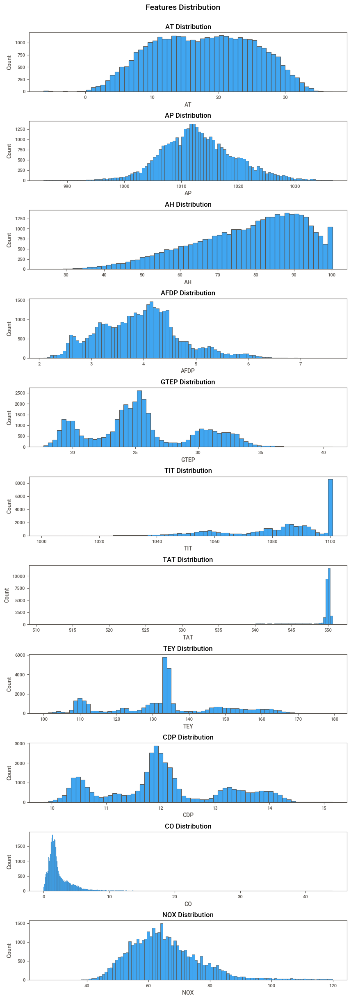

In [23]:
fig, axes=plt.subplots(11,1,figsize=(10,30))
for i,col in enumerate(cols):
    sns.histplot(x=col, data=data, ax=axes[i])
    axes[i].set_ylabel("Count")
    axes[i].set_title(f"{col} Distribution")
fig.text(0.5, 0.9,"Features Distribution",va="center", ha="center", fontsize=14)
plt.subplots_adjust(hspace=0.5)
plt.show()

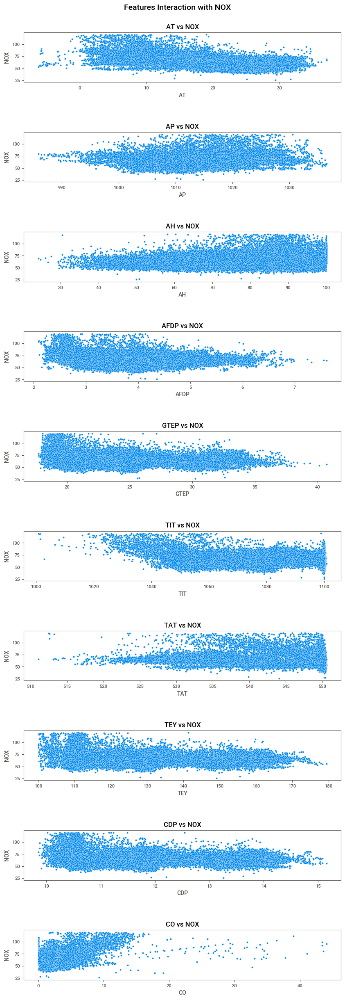

In [27]:
fig, axes=plt.subplots(10,1,figsize=(10,30))
for i,col in enumerate(cols[:-1]):
    sns.scatterplot(x=col,y="NOX", data=data, ax=axes[i])
    axes[i].set_ylabel("NOX")
    axes[i].set_title(f"{col} vs NOX")
fig.text(0.5, 0.9,"Features Interaction with NOX",va="center", ha="center", fontsize=14)
plt.subplots_adjust(hspace=1)
plt.show()

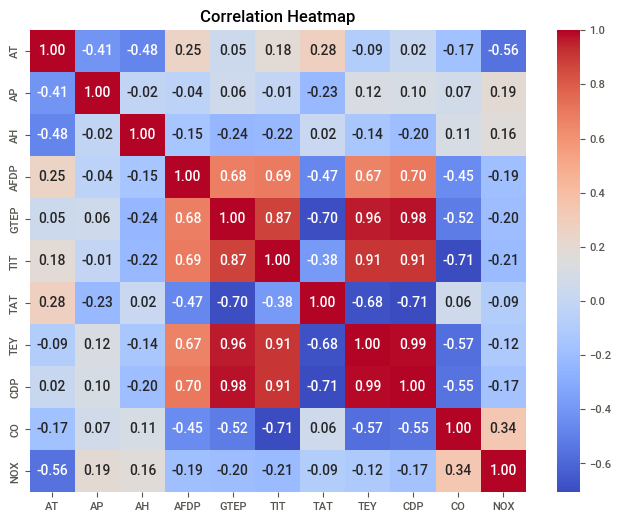

In [28]:
correlation_matrix = data.corr()
plt.figure(figsize=(8,6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [29]:
x=data.iloc[:,:-1]
print("Input Variables:")
display(x)

Input Variables:


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747
...,...,...,...,...,...,...,...,...,...,...
36728,3.6268,1028.5,93.200,3.1661,19.087,1037.0,541.59,109.08,10.411,10.99300
36729,4.1674,1028.6,94.036,3.1923,19.016,1037.6,542.28,108.79,10.344,11.14400
36730,5.4820,1028.5,95.219,3.3128,18.857,1038.0,543.48,107.81,10.462,11.41400
36731,5.8837,1028.7,94.200,3.9831,23.563,1076.9,550.11,131.41,11.771,3.31340


In [30]:
y=data.iloc[:,-1]
print("Output variable:")
display(y)

Output variable:


0         81.952
1         82.377
2         83.776
3         82.505
4         82.028
          ...   
36728     89.172
36729     88.849
36730     96.147
36731     64.738
36732    109.240
Name: NOX, Length: 36733, dtype: float64

## Training Model

In [32]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=2)
print("Train-Test Split:")
print("Training variables:")
print("Input:")
display(x_train)
print()
print("Output:")
display(y_train)
print('\n')
print("Testing variables:")
print("Input:")
display(x_test)
print()
print("Output:")
display(y_test)

Train-Test Split:
Training variables:
Input:


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
10710,25.5810,1008.8,84.579,4.1100,25.636,1090.0,550.42,132.86,12.156,1.71190
2510,18.4010,1012.4,77.809,4.4260,31.534,1100.0,533.48,156.32,13.652,0.41752
35991,20.5990,1002.2,63.696,3.5426,24.089,1076.6,550.27,129.13,11.768,2.21490
3098,26.2460,1013.2,53.119,4.4381,30.841,1100.0,536.38,148.97,13.383,0.90193
2072,13.6380,1007.6,71.053,4.2477,23.485,1082.1,549.86,130.74,11.756,3.07310
...,...,...,...,...,...,...,...,...,...,...
31019,7.7533,1011.8,73.067,2.6621,20.886,1039.7,545.41,109.27,10.390,8.06510
30280,10.7550,1017.4,66.106,4.0928,31.808,1099.9,537.88,157.61,13.667,3.09160
6637,10.3350,1029.3,68.066,5.1298,32.376,1098.6,527.65,160.46,14.018,1.15950
35343,15.8870,1007.2,86.328,3.2999,24.043,1076.1,550.25,130.07,11.791,3.02820



Output:


10710    59.223
2510     61.726
35991    52.160
3098     62.351
2072     77.582
          ...  
31019    82.260
30280    61.137
6637     63.865
35343    56.304
23720    57.141
Name: NOX, Length: 25713, dtype: float64



Testing variables:
Input:


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO
7458,5.1136,1022.80,91.462,5.2454,31.325,1099.6,532.50,156.91,13.671,0.81911
29956,16.3690,994.33,61.496,3.2106,28.451,1074.1,550.38,129.59,11.681,3.66670
15837,9.7867,1015.70,96.182,2.5452,19.514,1037.4,536.86,109.21,10.517,12.82000
2265,10.0700,1015.60,87.574,2.9802,19.451,1053.7,546.12,114.39,10.631,4.16850
31244,9.2941,1019.90,83.046,3.3629,24.893,1082.8,550.04,136.42,12.010,2.57600
...,...,...,...,...,...,...,...,...,...,...
1109,10.3510,1013.40,69.262,5.3029,32.024,1099.9,530.80,159.80,13.859,0.84475
17370,17.7470,1015.90,82.861,3.4355,24.586,1086.9,550.15,131.94,11.852,1.66850
23025,7.3746,1021.00,86.081,2.7544,19.064,1030.8,540.96,107.28,10.339,8.00810
7468,8.2406,1022.90,88.949,4.3147,24.901,1091.1,550.15,139.36,12.131,1.41340



Output:


7458      66.938
29956     59.577
15837    104.140
2265      77.082
31244     65.318
          ...   
1109      70.687
17370     71.014
23025     90.902
7468      79.667
32775     58.211
Name: NOX, Length: 11020, dtype: float64

In [34]:
print("Standard scaling the input training variables:")
x_train_scaled = StandardScaler().fit_transform(x_train)
display(x_train_scaled)

Standard scaling the input training variables:


array([[ 1.05674477, -0.65664248,  0.46286499, ..., -0.04146359,
         0.0879338 , -0.28628074],
       [ 0.09268305, -0.09944963, -0.00491498, ...,  1.46193176,
         1.46284252, -0.84878084],
       [ 0.38780946, -1.6781627 , -0.98006693, ..., -0.28049448,
        -0.26866017, -0.0676915 ],
       ...,
       [-0.99034228,  2.51626125, -0.67811738, ...,  1.72723683,
         1.79921725, -0.5263378 ],
       [-0.24487283, -0.90428375,  0.5837139 , ..., -0.22025614,
        -0.24752187,  0.28574515],
       [-0.46212239,  0.22557953,  1.42468141, ...,  0.04312643,
        -0.02786734, -0.4719295 ]])

In [35]:
print("Standard scaling the input testing variables:")
x_test_scaled = StandardScaler().fit_transform(x_test)
display(x_test_scaled)

Standard scaling the input testing variables:


array([[-1.69254836,  1.49430073,  0.94397041, ...,  1.49548787,
         1.47648034, -0.71770449],
       [-0.18107343, -2.90725956, -1.13205093, ..., -0.25014952,
        -0.34848594,  0.59442751],
       [-1.06500305,  0.39661622,  1.27096837, ..., -1.55234901,
        -1.41595365,  4.8121477 ],
       ...,
       [-1.38892123,  1.21601452,  0.57117889, ..., -1.6756682 ,
        -1.57919184,  2.5948875 ],
       [-1.27262707,  1.50976108,  0.76987171, ...,  0.37411393,
         0.06419488, -0.44386347],
       [ 1.31275594, -0.6701476 , -2.24987127, ...,  0.38050352,
         0.4099297 , -0.41884275]])

In [37]:
models=[LinearRegression(), Lasso(), Ridge(), SVR(), KNeighborsRegressor(), DecisionTreeRegressor(),
        XGBRegressor(),RandomForestRegressor(),ExtraTreesRegressor()]
r2_scores=[]
print("Model Trainging:\n")
for model in models:
    print(f"Model used: {model}.")
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    r2=round(r2_score(y_test, y_pred),4)
    print(f"Accuracy Acquired: {r2}.")
    r2_scores.append(r2)
    print()
max_r2=max(r2_scores)
print(f"Best R2 Score Recorded: {max_r2}.")
max_idx=r2_scores.index(max_r2)
best_model=models[max_idx]
print()
print(f"Best Model Perfomance: {best_model}.")

Model Trainging:

Model used: LinearRegression().
Accuracy Acquired: 0.5667.

Model used: Lasso().
Accuracy Acquired: 0.5483.

Model used: Ridge().
Accuracy Acquired: 0.5667.

Model used: SVR().
Accuracy Acquired: 0.0688.

Model used: KNeighborsRegressor().
Accuracy Acquired: 0.8144.

Model used: DecisionTreeRegressor().
Accuracy Acquired: 0.7592.

Model used: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             mult

In [41]:
print("Evaluating Best Model:")
et=ExtraTreesRegressor()
et.fit(x_train,y_train)
y_pred=model.predict(x_test)
r2=round(r2_score(y_test,y_pred),4)
mae=mean_absolute_error(y_test,y_pred)
mse=mean_squared_error(y_test,y_pred)
print(f"R2 Score: {r2}.")
print(f"Mean Squared Error: {mse}.")
print(f"Mean Absolute Error: {mae}.")

Evaluating Best Model:
R2 Score: 0.9029.
Mean Squared Error: 13.2202840286044.
Mean Absolute Error: 2.2508297704174227.


In [43]:
print("Model Saved.")
joblib.dump(et, 'Extra_Trees_Regressor_Model.joblib')

Model Saved.


['Extra_Trees_Regressor_Model.joblib']

## Predictive Model

In [3]:
model_paths=["/kaggle/working/Extra_Trees_Regressor_Model.joblib","/kaggle/input/gas-turbine-model/Extra_Trees_Regressor_Model.joblib"]
for path in model_paths:
    if os.path.exists(path):
        model_path=path
print(f"Model to be extracted from {model_path}.")

Model to be extracted from /kaggle/input/gas-turbine-model/Extra_Trees_Regressor_Model.joblib.


In [4]:
loaded_model=joblib.load(model_path)
print("Extracted Model:")
display(loaded_model)

Extracted Model:


ExtraTreesRegressor()

In [11]:
print("Enter the input details:")
AT=7.7533
AP=1011.8
AH=73.067
AFDP=2.6621
GTEP=20.886
TIT=1039.7
TAT=545.41
TEY=109.27
CDP=10.390
CO=8.06510
new_data=np.array([[AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO]])
print(*new_data)
NOX_pred=round(loaded_model.predict(new_data)[0],2)
print(f"Predicted Nitrous Oxides Emission Amount: {NOX_pred}")

Enter the input details:
[   7.7533 1011.8      73.067     2.6621   20.886  1039.7     545.41
  109.27     10.39      8.0651]
Predicted Nitrous Oxides Emission Amount: 82.26
